In [104]:
import numpy as np
import pandas as pd
import scipy
from scipy import stats
from scipy.stats import norm,t

import statsmodels
from statsmodels import stats
from statsmodels.stats import weightstats

import statsmodels.api as sm
from statsmodels.formula.api import ols
import statsmodels.stats.multicomp
from statsmodels.stats.multicomp import pairwise_tukeyhsd

from statsmodels.stats import proportion
from scipy.stats import chisquare
from scipy.stats import chi2_contingency
from scipy.stats import ttest_ind


import matplotlib
from matplotlib import pyplot as plt
import pylab
from pylab import plot, show, legend, show, title, xlabel, ylabel

import sklearn
from sklearn.model_selection import train_test_split

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

from statsmodels.discrete import discrete_model
from statsmodels.discrete.discrete_model import MNLogit

import mord
from mord import LogisticAT

import statsmodels.formula.api as smf
from statsmodels.discrete.discrete_model import Poisson as psn
from statsmodels.discrete.discrete_model import NegativeBinomial as nbm

import os
os.chdir(r"C:\Users\abhij\Downloads")

from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.api import ExponentialSmoothing, Holt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA

import seaborn as sns

# Load and inspect the dataset.

In [105]:
df = pd.read_csv('data.csv')

In [106]:
df.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [107]:
df.tail()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009
6818,0,0.493053,0.570105,0.549548,0.627409,0.627409,0.998080,0.801987,0.813800,0.313415,...,0.815956,0.000707,0.626680,0.627408,0.841019,0.275114,0.026793,0.565167,1,0.233902


In [108]:
df.columns

Index(['Bankrupt?', ' ROA(C) before interest and depreciation before interest',
       ' ROA(A) before interest and % after tax',
       ' ROA(B) before interest and depreciation after tax',
       ' Operating Gross Margin', ' Realized Sales Gross Margin',
       ' Operating Profit Rate', ' Pre-tax net Interest Rate',
       ' After-tax net Interest Rate',
       ' Non-industry income and expenditure/revenue',
       ' Continuous interest rate (after tax)', ' Operating Expense Rate',
       ' Research and development expense rate', ' Cash flow rate',
       ' Interest-bearing debt interest rate', ' Tax rate (A)',
       ' Net Value Per Share (B)', ' Net Value Per Share (A)',
       ' Net Value Per Share (C)', ' Persistent EPS in the Last Four Seasons',
       ' Cash Flow Per Share', ' Revenue Per Share (Yuan ¥)',
       ' Operating Profit Per Share (Yuan ¥)',
       ' Per Share Net profit before tax (Yuan ¥)',
       ' Realized Sales Gross Profit Growth Rate',
       ' Operating Profit

In [109]:
df.dtypes

Bankrupt?                                                     int64
 ROA(C) before interest and depreciation before interest    float64
 ROA(A) before interest and % after tax                     float64
 ROA(B) before interest and depreciation after tax          float64
 Operating Gross Margin                                     float64
                                                             ...   
 Liability to Equity                                        float64
 Degree of Financial Leverage (DFL)                         float64
 Interest Coverage Ratio (Interest expense to EBIT)         float64
 Net Income Flag                                              int64
 Equity to Liability                                        float64
Length: 96, dtype: object

In [110]:
df.shape

(6819, 96)

In [111]:
duplicated_indices = df[df.duplicated()].index
duplicated_indices

Index([], dtype='int64')

# Handle missing values appropriately.

In [112]:
null_indices = df[df.isnull().any(axis=1)].index
null_indices

Index([], dtype='int64')

# Detect and handle outliers.

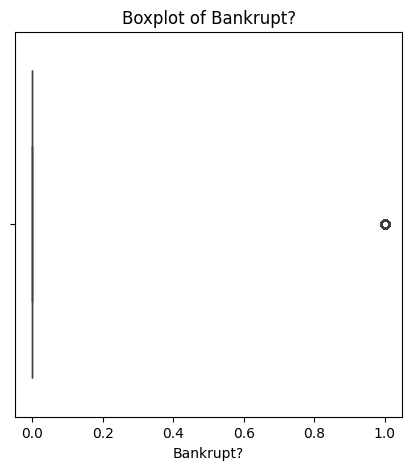

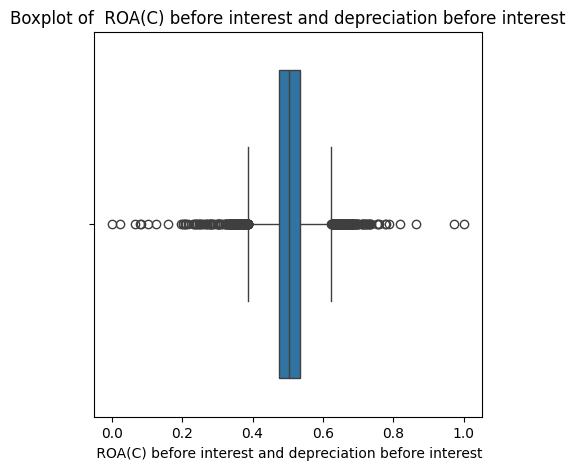

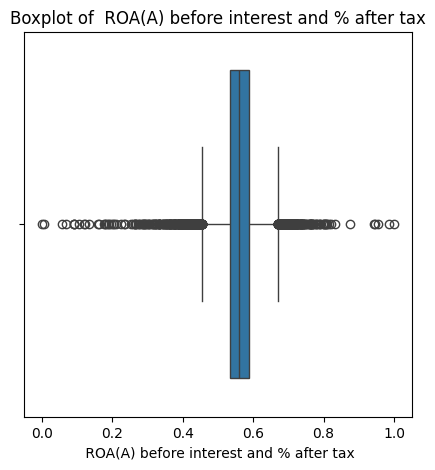

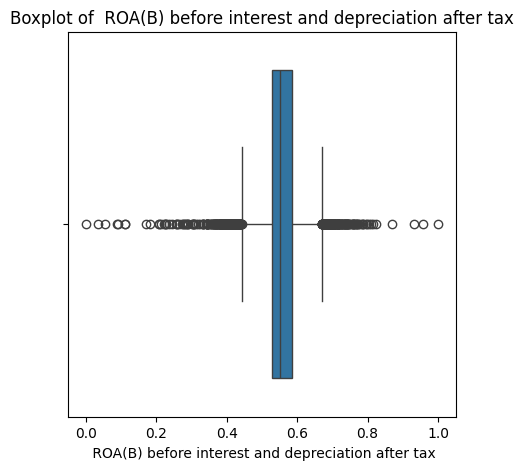

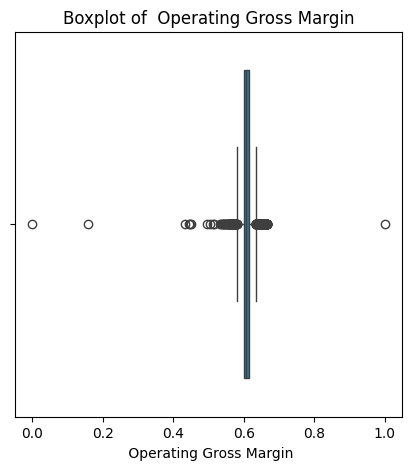

...

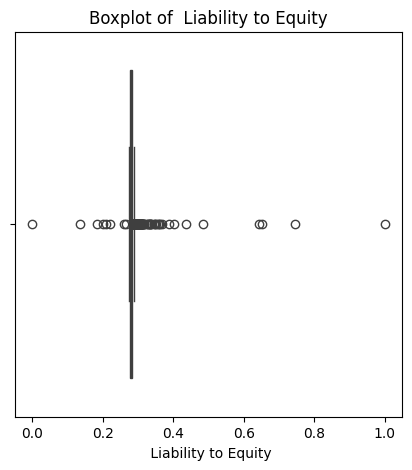

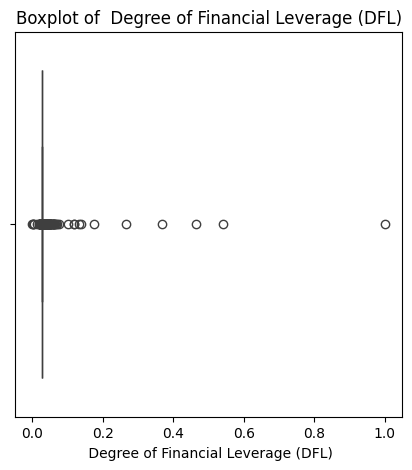

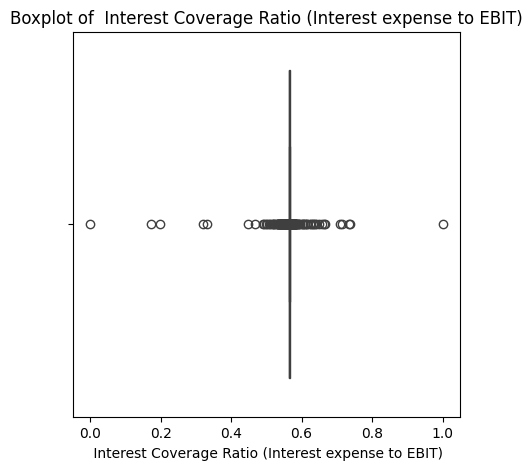

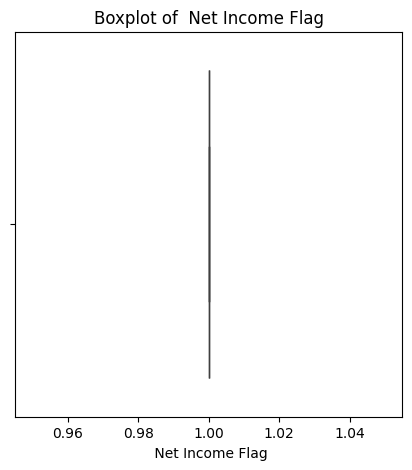

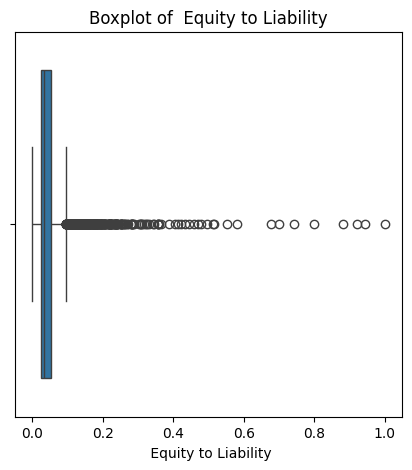

In [113]:
for column in df.columns:
    plt.figure(figsize=(5, 5))
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.show()

In [114]:
df.shape

(6819, 96)

In [115]:
def impute_outliers(df, column):
    q1 = df[column].quantile(0.25)
    q3 = df[column].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr

    df.loc[df[column] < lower_bound, column] = lower_bound
    df.loc[df[column] > upper_bound, column] = upper_bound

    return df
    
    
columns_to_impute = df.columns.difference(['Bankrupt?','Current Liability to Current Assets','Net Income Flag'])

for column in columns_to_impute:
    df = impute_outliers(df, column)

In [116]:
df.shape

(6819, 96)

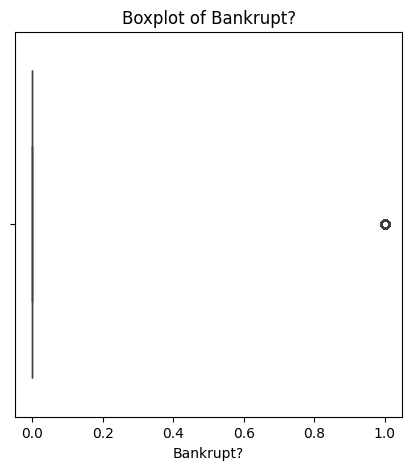

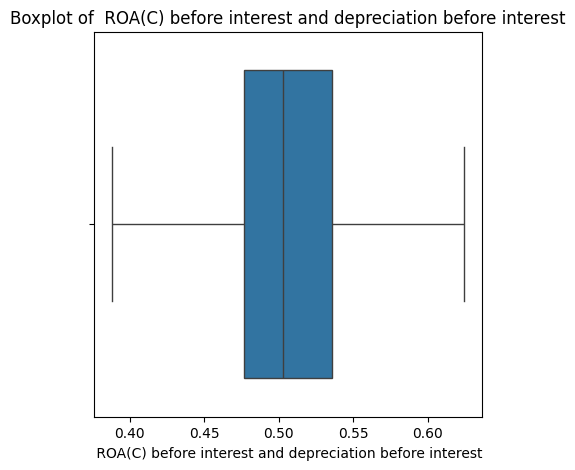

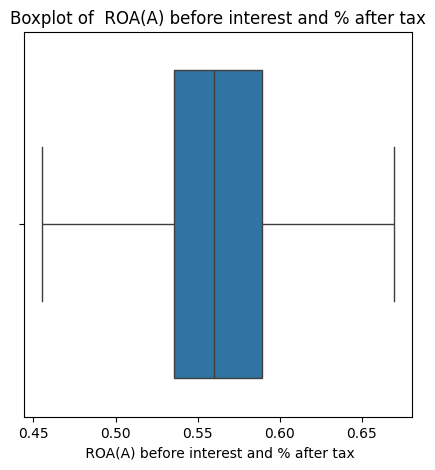

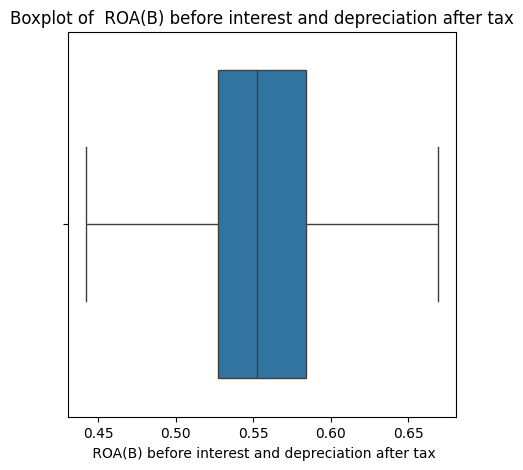

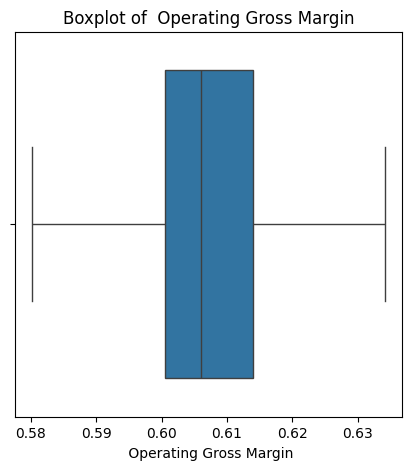

...

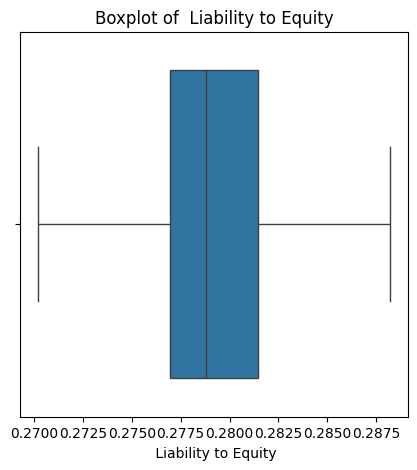

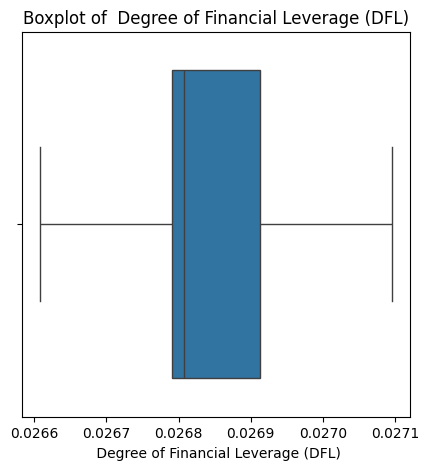

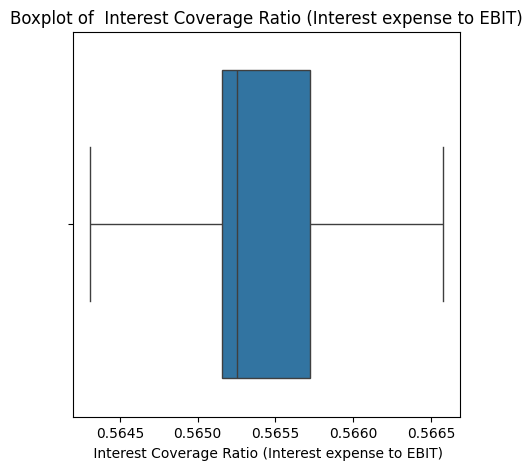

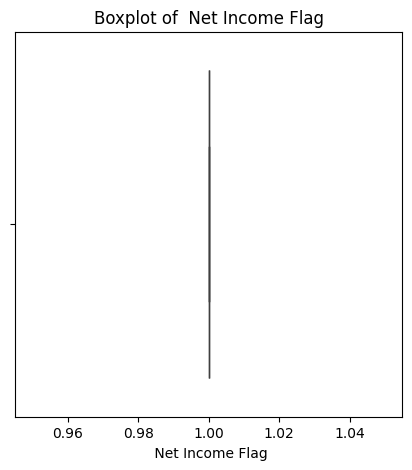

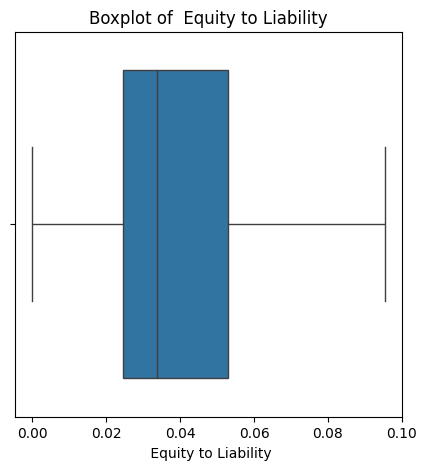

In [117]:
for column in df.columns:
    plt.figure(figsize=(5, 5))
    sns.boxplot(x=df[column])
    plt.title(f'Boxplot of {column}')
    plt.xlabel(column)
    plt.show()

# Generate descriptive statistics.

In [118]:
df.describe()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Operating Gross Margin,Realized Sales Gross Margin,Operating Profit Rate,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,...,Net Income to Total Assets,Total assets to GNP price,No-credit Interval,Gross Profit to Sales,Net Income to Stockholder's Equity,Liability to Equity,Degree of Financial Leverage (DFL),Interest Coverage Ratio (Interest expense to EBIT),Net Income Flag,Equity to Liability
count,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,...,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.000000,6819.0,6819.000000
mean,0.032263,0.505667,0.560507,0.554691,0.607834,0.607812,0.999028,0.797467,0.809378,0.303526,...,0.810070,0.003750,0.623890,0.607833,0.841060,0.279689,0.026846,0.565422,1.0,0.042019
std,0.176710,0.051483,0.050087,0.050277,0.010758,0.010725,0.000120,0.000189,0.000157,0.000124,...,0.027735,0.003805,0.000553,0.010758,0.002057,0.003566,0.000138,0.000627,0.0,0.023671
min,0.000000,0.387973,0.455122,0.442034,0.580240,0.580321,0.998781,0.797096,0.809075,0.303288,...,0.752193,0.000000,0.622838,0.580237,0.836752,0.270187,0.026608,0.564309,1.0,0.000000
25%,0.000000,0.476527,0.535543,0.527277,0.600445,0.600434,0.998969,0.797386,0.809312,0.303466,...,0.796750,0.000904,0.623636,0.600443,0.840115,0.276944,0.026791,0.565158,1.0,0.024477
50%,0.000000,0.502706,0.559802,0.552278,0.605997,0.605976,0.999022,0.797464,0.809375,0.303525,...,0.810619,0.002085,0.623879,0.605998,0.841179,0.278778,0.026808,0.565252,1.0,0.033798
75%,0.000000,0.535563,0.589157,0.584105,0.613914,0.613842,0.999095,0.797579,0.809469,0.303585,...,0.826455,0.005270,0.624168,0.613913,0.842357,0.281449,0.026913,0.565725,1.0,0.052838
max,1.000000,0.624116,0.669579,0.669348,0.634118,0.633954,0.999282,0.797868,0.809706,0.303764,...,0.871012,0.011819,0.624966,0.634119,0.845720,0.288207,0.027096,0.566574,1.0,0.095380


# Visualize feature distributions and target variable.

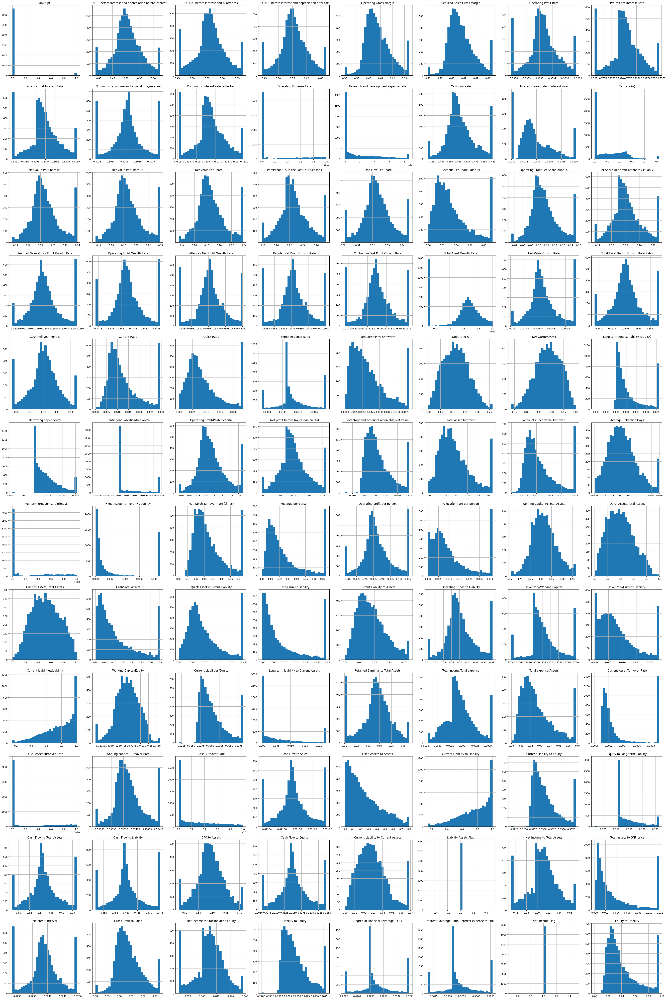

In [119]:
df.hist(bins=30, figsize=(40, 60), layout=(12, 8))
plt.tight_layout()
plt.show()

In [120]:
df['Bankrupt?'].value_counts()

Bankrupt?
0    6599
1     220
Name: count, dtype: int64

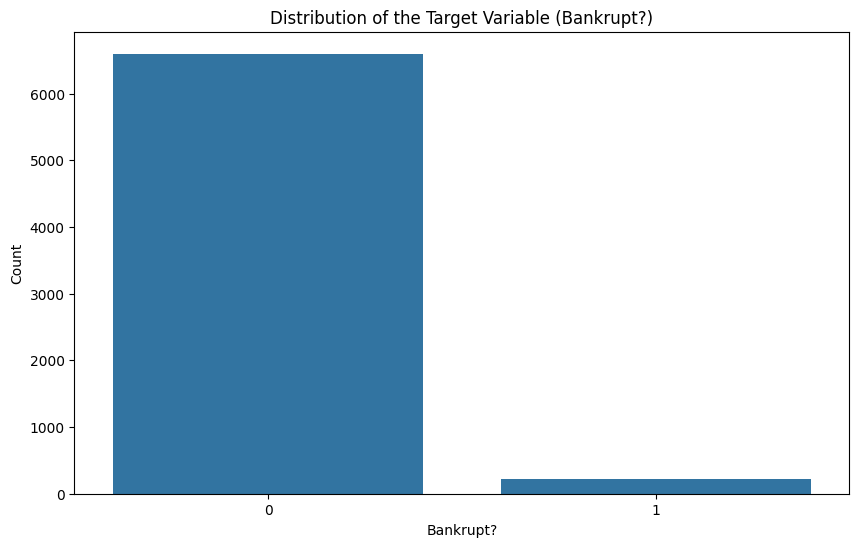

In [121]:
plt.figure(figsize=(10, 6))
sns.countplot(x='Bankrupt?', data=df)
plt.title('Distribution of the Target Variable (Bankrupt?)')
plt.xlabel('Bankrupt?')
plt.ylabel('Count')
plt.show()

In [122]:
bankrupt_df = df[df['Bankrupt?'] == 1]
non_bankrupt_df = df[df['Bankrupt?'] == 0]

#T-Test
def t_test_features(df, target_column):
    numerical_columns = df.select_dtypes(include=[np.number]).columns
    significant_features = []

    for column in numerical_columns:
        if column == target_column:
            continue
        t_stat, p_value = ttest_ind(bankrupt_df[column], non_bankrupt_df[column], nan_policy='omit')
        if p_value < 0.05:
            significant_features.append((column, p_value))
            print(f"Feature: {column} | p-value: {p_value}")

    return significant_features




significant_numerical_features = t_test_features(df, 'Bankrupt?')

count=0
for feature, p_value in significant_numerical_features:
    print(f"Feature: {feature} | p-value: {p_value}")
    count+=1
print(count)





Feature:  ROA(C) before interest and depreciation before interest | p-value: 1.3480464196848803e-89
Feature:  ROA(A) before interest and % after tax | p-value: 1.453424003163958e-89
Feature:  ROA(B) before interest and depreciation after tax | p-value: 1.867512034084068e-91
Feature:  Operating Gross Margin | p-value: 3.2823739125123346e-31
Feature:  Realized Sales Gross Margin | p-value: 6.967922607227421e-31
Feature:  Operating Profit Rate | p-value: 9.863440509107753e-59
Feature:  Pre-tax net Interest Rate | p-value: 1.8306696788047566e-88
Feature:  After-tax net Interest Rate | p-value: 1.4947479061257782e-89
Feature:  Non-industry income and expenditure/revenue | p-value: 8.370733607811912e-72
Feature:  Continuous interest rate (after tax) | p-value: 1.4678863402201738e-96
Feature:  Research and development expense rate | p-value: 0.04086666500300871
Feature:  Cash flow rate | p-value: 2.277319208124462e-23
Feature:  Interest-bearing debt interest rate | p-value: 5.290686259142438e

C:\Users\abhij\AppData\Local\Programs\Python\Python312\Lib\site-packages\scipy\stats\_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


In [123]:


# co-relation
corr_matrix = df.corr()

# target variable bankrupt
corr_with_target = corr_matrix['Bankrupt?'].sort_values(ascending=False)

# printing
print(corr_with_target)

Bankrupt?                                   1.000000
 Borrowing dependency                       0.278367
 Total debt/Total net worth                 0.272914
 Debt ratio %                               0.246535
 Liability to Equity                        0.246176
                                              ...   
 Retained Earnings to Total Assets         -0.255218
 Net Income to Total Assets                -0.255797
 Persistent EPS in the Last Four Seasons   -0.256159
 Liability-Assets Flag                           NaN
 Net Income Flag                                 NaN
Name: Bankrupt?, Length: 96, dtype: float64


In [124]:
target.isnull().sum()

2

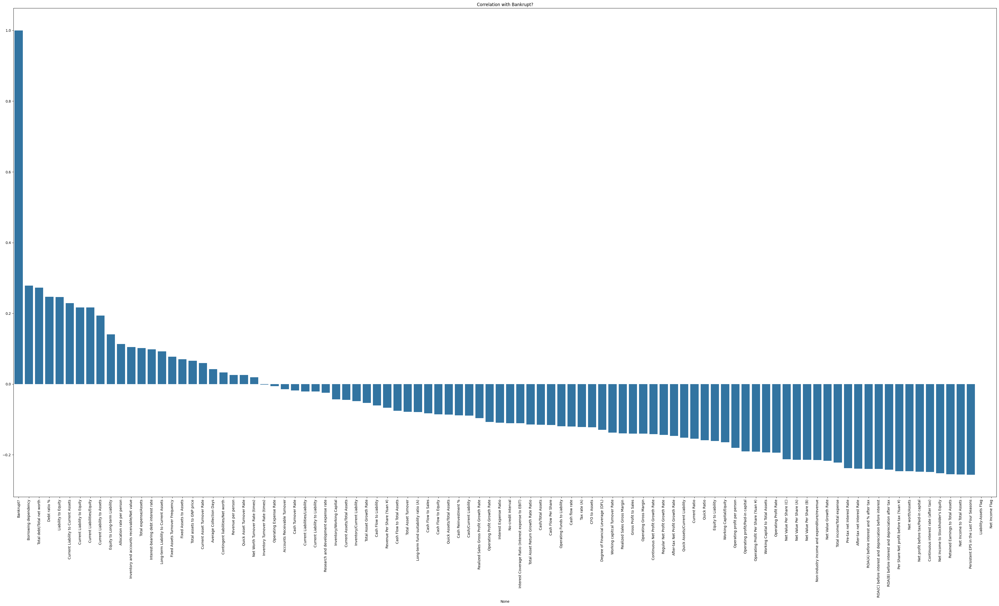

In [125]:
# Plot the correlations
plt.figure(figsize=(50, 25))
sns.barplot(x=corr_with_target.index, y=corr_with_target.values)
plt.xticks(rotation=90)
plt.title('Correlation with Bankrupt?')
plt.show()

<Axes: >

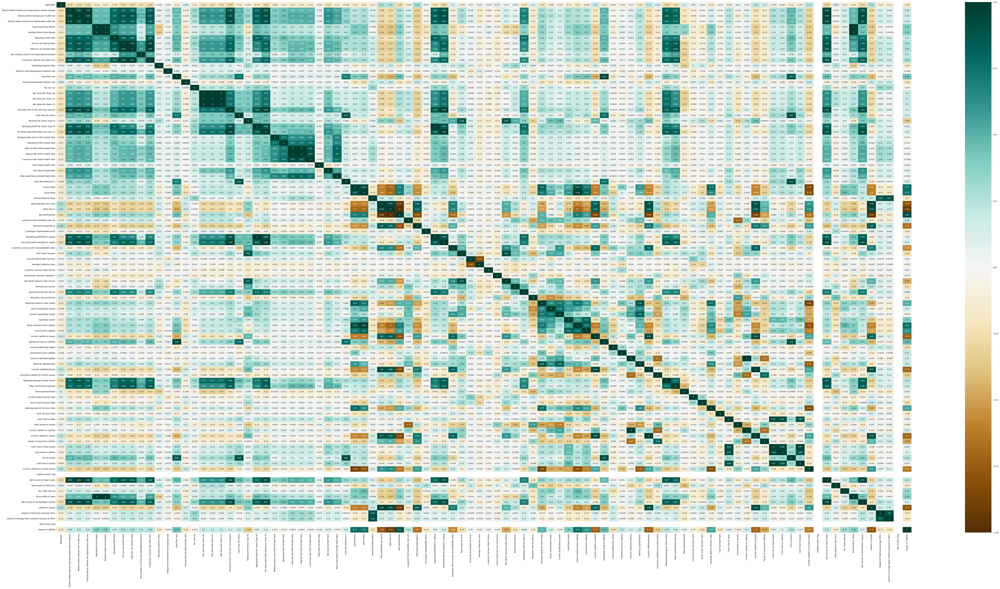

In [126]:
plt.figure(figsize=(100,50))
corr = df.corr()
sns.heatmap(corr, cmap="BrBG",annot=True)


In [127]:
corr_matrix = df.corr()
threshold = 0.2
target = corr_matrix['Bankrupt?'].abs()
relevant_features = target[target > threshold].index.tolist()
df1 = df[relevant_features]
df1

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Net Value Per Share (B),Net Value Per Share (A),...,Borrowing dependency,Net profit before tax/Paid-in capital,Current Liabilities/Equity,Retained Earnings to Total Assets,Total income/Total expense,Current Liability to Equity,Current Liability to Current Assets,Net Income to Total Assets,Net Income to Stockholder's Equity,Liability to Equity
0,1,0.387973,0.455122,0.442034,0.797096,0.809075,0.303288,0.781314,0.147950,0.147950,...,0.385425,0.137757,0.338662,0.910524,0.002022,0.338662,0.068886,0.752193,0.836752,0.288207
1,1,0.464291,0.538214,0.516730,0.797380,0.809301,0.303556,0.781506,0.182251,0.182251,...,0.376760,0.168962,0.329740,0.931065,0.002226,0.329740,0.047775,0.795297,0.839969,0.283846
2,1,0.426071,0.499019,0.472295,0.797096,0.809075,0.303288,0.781314,0.177911,0.177911,...,0.379093,0.148036,0.334777,0.910524,0.002060,0.334777,0.025346,0.774670,0.836774,0.288207
3,1,0.399844,0.455122,0.457733,0.797096,0.809075,0.303350,0.781314,0.154187,0.154187,...,0.379743,0.147561,0.331509,0.910524,0.001851,0.331509,0.067250,0.752193,0.836752,0.281721
4,1,0.465022,0.538432,0.522298,0.797366,0.809304,0.303475,0.781550,0.167502,0.167502,...,0.375025,0.167461,0.330726,0.913850,0.002224,0.330726,0.047725,0.795016,0.839973,0.278514
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6814,0,0.493687,0.539468,0.543230,0.797409,0.809331,0.303510,0.781588,0.175045,0.175045,...,0.373823,0.171111,0.330914,0.925611,0.002266,0.330914,0.027951,0.799927,0.840359,0.279606
6815,0,0.475162,0.538269,0.524172,0.797414,0.809327,0.303520,0.781586,0.181324,0.181324,...,0.372505,0.171805,0.329753,0.932629,0.002288,0.329753,0.031470,0.799748,0.840306,0.278132
6816,0,0.472725,0.533744,0.520638,0.797401,0.809317,0.303512,0.781546,0.238507,0.238507,...,0.369637,0.172287,0.326921,0.932000,0.002239,0.326921,0.007542,0.797778,0.840138,0.275789
6817,0,0.506264,0.559911,0.554045,0.797500,0.809399,0.303498,0.781663,0.213392,0.213392,...,0.369649,0.182498,0.329294,0.939613,0.002395,0.329294,0.022916,0.811808,0.841084,0.277547


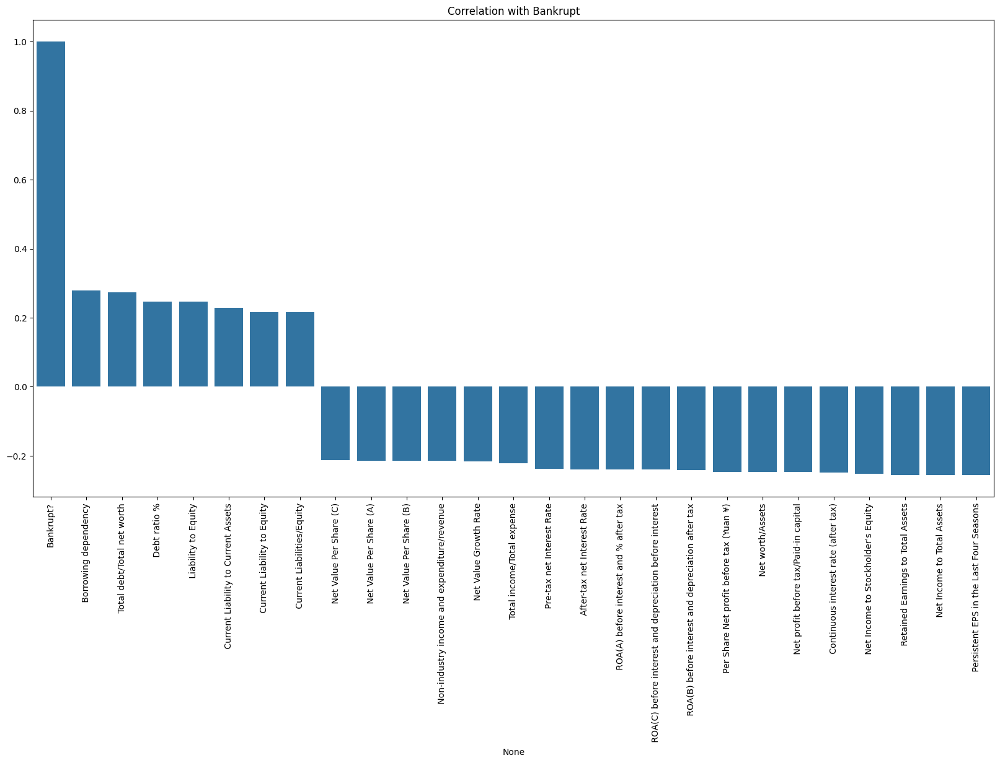

In [128]:
corr_matrix1 = df1.corr()
corr_with_target1 = corr_matrix1['Bankrupt?'].sort_values(ascending=False)

plt.figure(figsize=(20, 10))
sns.barplot(x=corr_with_target1.index, y=corr_with_target1.values)
plt.xticks(rotation=90)
plt.title('Correlation with Bankrupt')
plt.show()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Net Value Per Share (B),Net Value Per Share (A),...,Borrowing dependency,Net profit before tax/Paid-in capital,Current Liabilities/Equity,Retained Earnings to Total Assets,Total income/Total expense,Current Liability to Equity,Current Liability to Current Assets,Net Income to Total Assets,Net Income to Stockholder's Equity,Liability to Equity
Bankrupt?,1.000000,-0.239543,-0.239500,-0.241993,-0.238036,-0.239484,-0.214507,-0.248585,-0.214143,-0.213725,...,0.278367,-0.247467,0.216619,-0.255218,-0.221799,0.216619,0.229231,-0.255797,-0.251917,0.246176
ROA(C) before interest and depreciation before interest,-0.239543,1.000000,0.941564,0.988614,0.823454,0.810364,0.410102,0.836030,0.588946,0.588611,...,-0.311573,0.879985,-0.231259,0.804321,0.775651,-0.231259,-0.269303,0.930357,0.890314,-0.258969
ROA(A) before interest and % after tax,-0.239500,0.941564,1.000000,0.952666,0.876436,0.877649,0.505969,0.867825,0.632623,0.632445,...,-0.331452,0.921472,-0.208058,0.855882,0.834337,-0.208058,-0.312334,0.990799,0.952613,-0.254115
ROA(B) before interest and depreciation after tax,-0.241993,0.988614,0.952666,1.000000,0.829183,0.831419,0.412237,0.858169,0.590792,0.590570,...,-0.310342,0.869560,-0.237615,0.807971,0.786189,-0.237615,-0.275232,0.942100,0.900832,-0.263275
Pre-tax net Interest Rate,-0.238036,0.823454,0.876436,0.829183,1.000000,0.987637,0.604490,0.961856,0.599166,0.599243,...,-0.317517,0.808013,-0.274343,0.801705,0.859121,-0.274343,-0.311862,0.885762,0.836014,-0.300301
After-tax net Interest Rate,-0.239484,0.810364,0.877649,0.831419,0.987637,1.000000,0.601598,0.968825,0.594564,0.594696,...,-0.311366,0.792706,-0.276490,0.796113,0.862401,-0.276490,-0.313701,0.889530,0.841590,-0.300023
Non-industry income and expenditure/revenue,-0.214507,0.410102,0.505969,0.412237,0.604490,0.601598,1.000000,0.537608,0.408860,0.408844,...,-0.316844,0.494812,-0.247485,0.495126,0.566332,-0.247485,-0.209411,0.526756,0.505236,-0.271458
Continuous interest rate (after tax),-0.248585,0.836030,0.867825,0.858169,0.961856,0.968825,0.537608,1.000000,0.594596,0.594742,...,-0.309333,0.788940,-0.265769,0.792237,0.844985,-0.265769,-0.310381,0.876598,0.830559,-0.293661
Net Value Per Share (B),-0.214143,0.588946,0.632623,0.590792,0.599166,0.594564,0.408860,0.594596,1.000000,0.999685,...,-0.311011,0.746513,-0.239342,0.766730,0.640587,-0.239342,-0.256526,0.637903,0.619449,-0.266413
Net Value Per Share (A),-0.213725,0.588611,0.632445,0.590570,0.599243,0.594696,0.408844,0.594742,0.999685,1.000000,...,-0.311734,0.745822,-0.240170,0.766915,0.640540,-0.240170,-0.257635,0.637742,0.619532,-0.267166


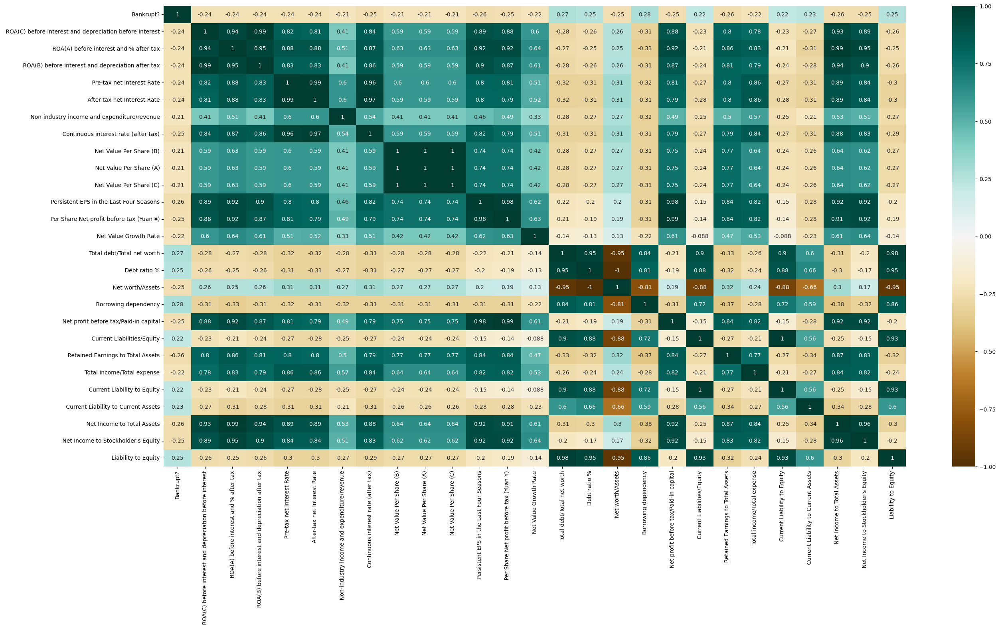

In [129]:
plt.figure(figsize=(30,15))
corr1 = df1.corr()
sns.heatmap(corr1, cmap="BrBG",annot=True)
corr1

In [130]:
df1.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,Pre-tax net Interest Rate,After-tax net Interest Rate,Non-industry income and expenditure/revenue,Continuous interest rate (after tax),Net Value Per Share (B),Net Value Per Share (A),...,Borrowing dependency,Net profit before tax/Paid-in capital,Current Liabilities/Equity,Retained Earnings to Total Assets,Total income/Total expense,Current Liability to Equity,Current Liability to Current Assets,Net Income to Total Assets,Net Income to Stockholder's Equity,Liability to Equity
0,1,0.387973,0.455122,0.442034,0.797096,0.809075,0.303288,0.781314,0.147950,0.147950,...,0.385425,0.137757,0.338662,0.910524,0.002022,0.338662,0.068886,0.752193,0.836752,0.288207
1,1,0.464291,0.538214,0.516730,0.797380,0.809301,0.303556,0.781506,0.182251,0.182251,...,0.376760,0.168962,0.329740,0.931065,0.002226,0.329740,0.047775,0.795297,0.839969,0.283846
2,1,0.426071,0.499019,0.472295,0.797096,0.809075,0.303288,0.781314,0.177911,0.177911,...,0.379093,0.148036,0.334777,0.910524,0.002060,0.334777,0.025346,0.774670,0.836774,0.288207
3,1,0.399844,0.455122,0.457733,0.797096,0.809075,0.303350,0.781314,0.154187,0.154187,...,0.379743,0.147561,0.331509,0.910524,0.001851,0.331509,0.067250,0.752193,0.836752,0.281721
4,1,0.465022,0.538432,0.522298,0.797366,0.809304,0.303475,0.781550,0.167502,0.167502,...,0.375025,0.167461,0.330726,0.913850,0.002224,0.330726,0.047725,0.795016,0.839973,0.278514


# Split the data into training and testing sets.

In [131]:
from sklearn.model_selection import train_test_split

# Splitting data into training (80%) and testing (20%) sets
x_train, x_test, y_train, y_test = train_test_split(df1.drop(columns=['Bankrupt?']), df1['Bankrupt?'], test_size=0.2, random_state=42)

Accuracy: 0.8387096774193549
Precision: 0.16862745098039217
Recall: 0.8431372549019608
F1 Score: 0.28104575163398693

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.84      0.91      1313
           1       0.17      0.84      0.28        51

    accuracy                           0.84      1364
   macro avg       0.58      0.84      0.60      1364
weighted avg       0.96      0.84      0.89      1364



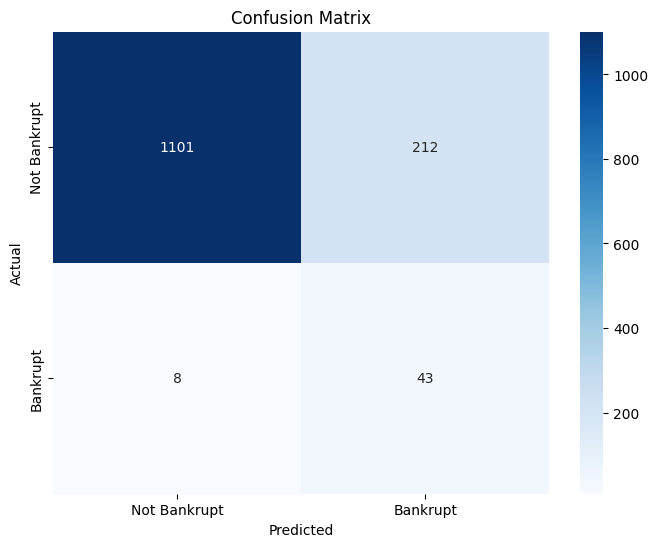

In [132]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report
import seaborn as sns
import matplotlib.pyplot as plt

# Initialize Logistic Regression model with class_weight balanced
model = LogisticRegression(random_state=42, max_iter=1000, class_weight='balanced')

# Fit the model on the training data
model.fit(x_train, y_train)

# Predict on the testing data
y_pred = model.predict(x_test)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print performance metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Bankrupt', 'Bankrupt'], yticklabels=['Not Bankrupt', 'Bankrupt'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

Accuracy: 0.843841642228739
Precision: 0.17338709677419356
Recall: 0.8431372549019608
F1 Score: 0.28762541806020064

Classification Report:
               precision    recall  f1-score   support

           0       0.99      0.84      0.91      1313
           1       0.17      0.84      0.29        51

    accuracy                           0.84      1364
   macro avg       0.58      0.84      0.60      1364
weighted avg       0.96      0.84      0.89      1364



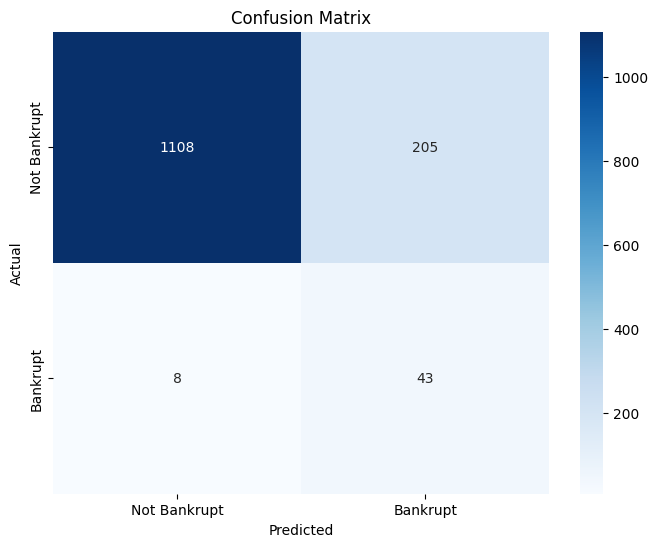

In [133]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE to the training data
sm = SMOTE(random_state=42)
x_train_res, y_train_res = sm.fit_resample(x_train, y_train)

# Initialize Logistic Regression model
model = LogisticRegression(random_state=42, max_iter=1000)

# Fit the model on the resampled training data
model.fit(x_train_res, y_train_res)

# Predict on the testing data
y_pred = model.predict(x_test)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print performance metrics
print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)

# Classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Plot confusion matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Not Bankrupt', 'Bankrupt'], yticklabels=['Not Bankrupt', 'Bankrupt'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

In [134]:
#predicting which terms affect the bankcurptcy  
coefficients = model.coef_[0]
feature_names = x_train.columns


coef_df = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})


coef_df['Abs_Coefficient'] = np.abs(coef_df['Coefficient'])
coef_df = coef_df.sort_values(by='Abs_Coefficient', ascending=False)


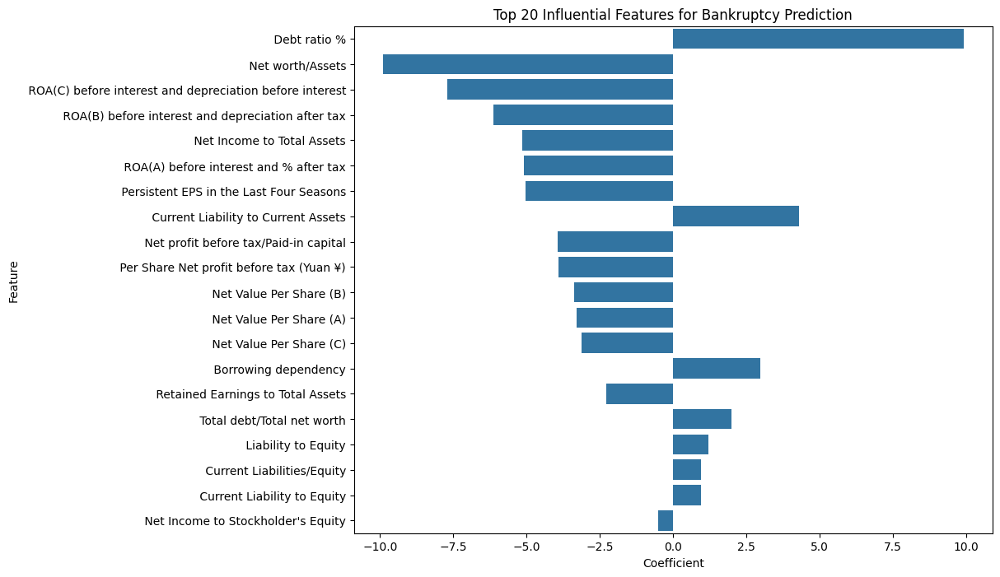

In [135]:
plt.figure(figsize=(10, 8))
sns.barplot(x='Coefficient', y='Feature', data=coef_df.head(20))
plt.title('Top 20 Influential Features for Bankruptcy Prediction')
plt.xlabel('Coefficient')
plt.ylabel('Feature')
plt.show()
